In [1]:
import os
import healpy as h
import collections
from modules.calc_EB_rec_noise.fast_calc_eb_rec_noise import calc_eb_rec_noise
from modules.calc_TB_rec_noise.fast_calc_tb_rec_noise import calc_tb_rec_noise
from modules import eb_rec
from modules import tb_rec

from astropy.io import fits
figpath="./masked_null_test/"

def ensure_dir(file_path):
    directory = os.path.dirname(file_path)
    if not os.path.exists(directory):
        os.makedirs(directory)
        
ensure_dir(figpath)

# jpegpath=figpath + "/jpeg/" ; ensure_dir(jpegpath)
datapath=figpath + "/data/" ; ensure_dir(datapath)

%pylab notebook

def return_Nl(fwhm,noise_rms,lmax):
    ell=np.arange(lmax+1)
    noise_rms=noise_rms*(1./60.)*(np.pi/180.)
    thetab=((fwhm/60.)*np.pi/180.)/np.sqrt(8.*np.log(2))
    Bl=exp(thetab**2 *(ell*(ell+1))/2)
    return ell,noise_rms**2. * Bl**2.

Populating the interactive namespace from numpy and matplotlib


# Theory spectra

In [10]:
nside=512
lmin=2
lmax=1024
Lmax=1024

clthry=np.loadtxt("../T2P_leakage/planck_2015_cmb/planck_2015_cmb_totCls.dat")
clthry=np.loadtxt("../T2P_leakage/planck_2015_cmb/planck_2015_cmb_lensedCls.dat")

maxell=3500
ell=clthry[:maxell+1,0] ; fl=ell*(ell+1)/(2.*pi)
cltt=clthry[:maxell+1,1]/fl ; cltt=append([0.,0.],cltt)
clee=clthry[:maxell+1,2]/fl ; clee=append([0.,0.],clee)
clbb=clthry[:maxell+1,3]/fl ; clbb=append([0.,0.],clbb)
clte=clthry[:maxell+1,4]/fl ; clte=append([0.,0.],clte)
ell=append([0.,1,],ell) ; fl=ell*(ell+1)/(2.*pi)
clthr=[cltt,clee,clbb,clte]


maskname="/Users/adityarotti/Documents/Work/Data/Planck/masks/HFI_Mask_GalPlane-apo2_2048_R2.00.fits"
mask=h.read_map(maskname,4,dtype=np.float64,verbose=False)
mask=h.ud_grade(mask,nside)
fsky=sum(mask)/size(mask)
print fsky

0.7200464609943648


# Simulate

Sigma is 12.739827 arcmin (0.003706 rad) 
-> fwhm is 30.000000 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin


<IPython.core.display.Javascript object>


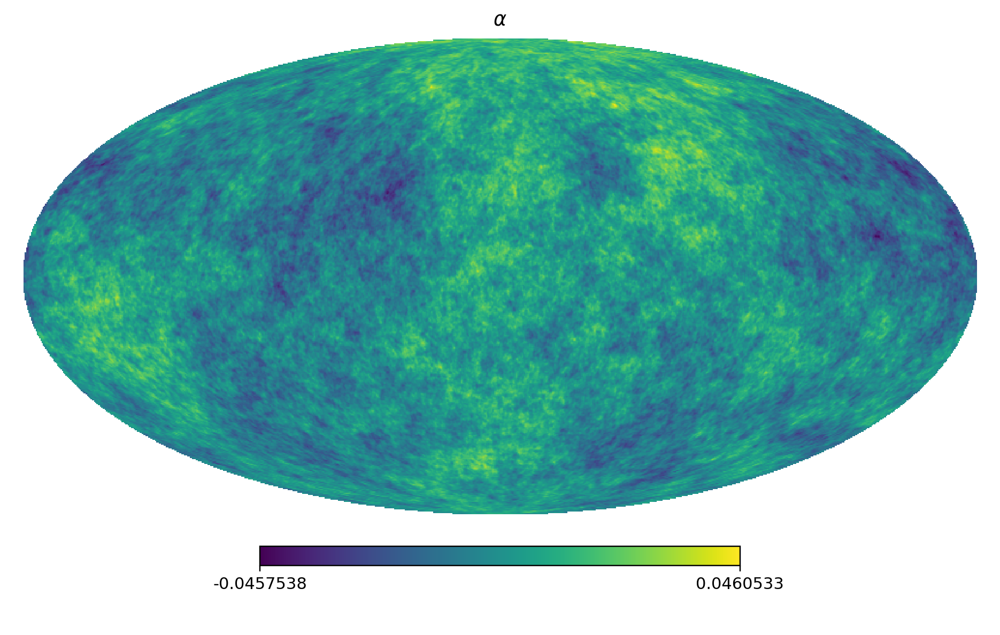

In [16]:
cmb=h.synfast(clthr,nside,new=True,pol=True,verbose=False,lmax=2*nside+200)

ell=np.arange(Lmax+1).astype(np.float64) ; cl_alpha=np.zeros_like(ell)
cl_alpha[1:]=1e-4*ell[1:]**-2.
# cl_alpha[1:]=1e-4
np.random.seed(0)
alpha=h.synfast(cls=cl_alpha,nside=nside,verbose=False)
clsig=h.alm2cl(h.map2alm(alpha,lmax=Lmax))

obs=np.zeros_like(cmb)
obs[0]=cmb[0]
obs[1]=cmb[1] - alpha*cmb[2]
obs[2]=cmb[2] + alpha*cmb[1]


h.mollview(h.smoothing(alpha,fwhm=(30./60.)*np.pi/180.),title=r"$\alpha$")
figname=figpath + "smoothed_alpha.pdf"
savefig(figname,bbox_inches="tight")

# QE analysis

## Null analysis

<IPython.core.display.Javascript object>


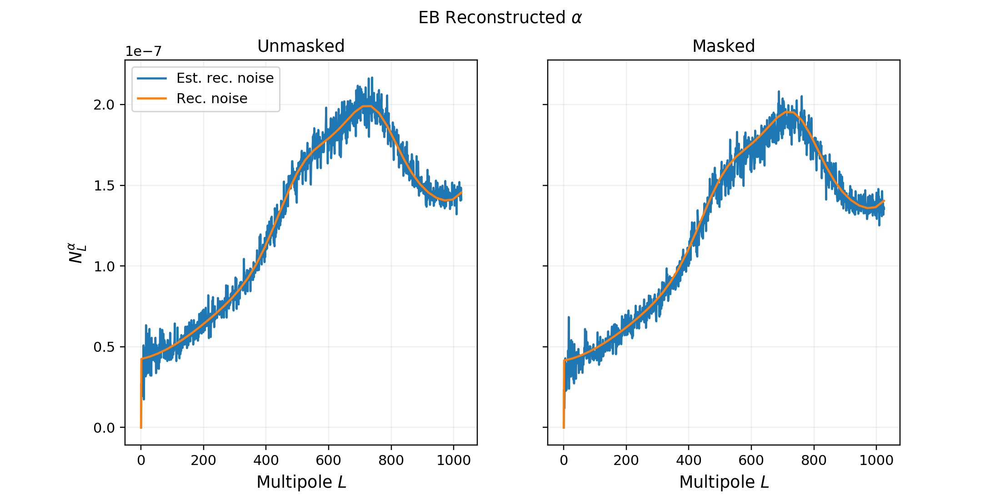

<IPython.core.display.Javascript object>


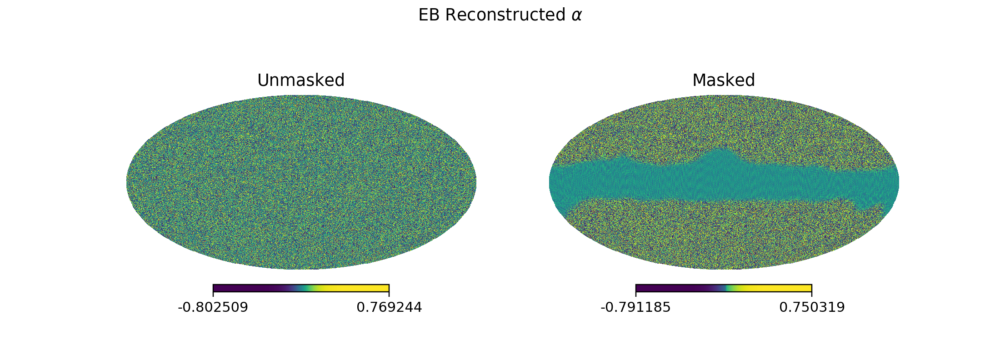

In [12]:
eb_pcmb=eb_rec.opt_eb_qe(cmb,clthr,lmax,Lmax,mask=mask,ellmin=lmin)
eb_pcmb.eb_reconstruct()

eb_cmb=eb_rec.opt_eb_qe(cmb,clthr,lmax,Lmax,ellmin=lmin)
eb_cmb.eb_reconstruct()

fig,ax=subplots(ncols=2,nrows=1,sharey=True,figsize=[10,5])
ax[0].plot(eb_cmb.Cl_rec_alpha,label="Est. rec. noise")
ax[0].plot(eb_cmb.N_L,label="Rec. noise")
ax[0].set_ylabel(r"$N_{L}^{\alpha}$",fontsize=12)
ax[0].set_xlabel(r"Multipole $L$",fontsize=12)
ax[0].grid(alpha=0.2)
ax[0].legend(loc=0)
ax[0].set_title("Unmasked")
ax[1].plot(eb_pcmb.Cl_rec_alpha)
ax[1].plot(eb_pcmb.N_L)
ax[1].set_xlabel(r"Multipole $L$",fontsize=12)
ax[1].grid(alpha=0.2)
ax[1].set_title("Masked")
suptitle(r"EB Reconstructed $\alpha$")
figname=figpath + "eb_null_masked_vs_unmasked_recnoise_lmin" + str(lmin) + "_lmax" + str(lmax) + "_Lmax" + str(Lmax) + ".pdf"
savefig(figname,bbox_inches="tight")

fig, (ax1, ax2) = plt.subplots(ncols=2,figsize=[10,3.5])
axes(ax1)
h.mollview( eb_cmb.rec_alpha ,hold=True,title="Unmasked",norm="hist")
axes(ax2)
h.mollview( eb_pcmb.rec_alpha ,hold=True,title="Masked",norm="hist")
suptitle(r"EB Reconstructed $\alpha$")
figname=figpath + "eb_null_masked_vs_unmasked_reconstructed_alpha_lmin" + str(lmin) + "_lmax" + str(lmax) + "_Lmax" + str(Lmax) + ".pdf"
savefig(figname,bbox_inches="tight",dpi=300)

<IPython.core.display.Javascript object>


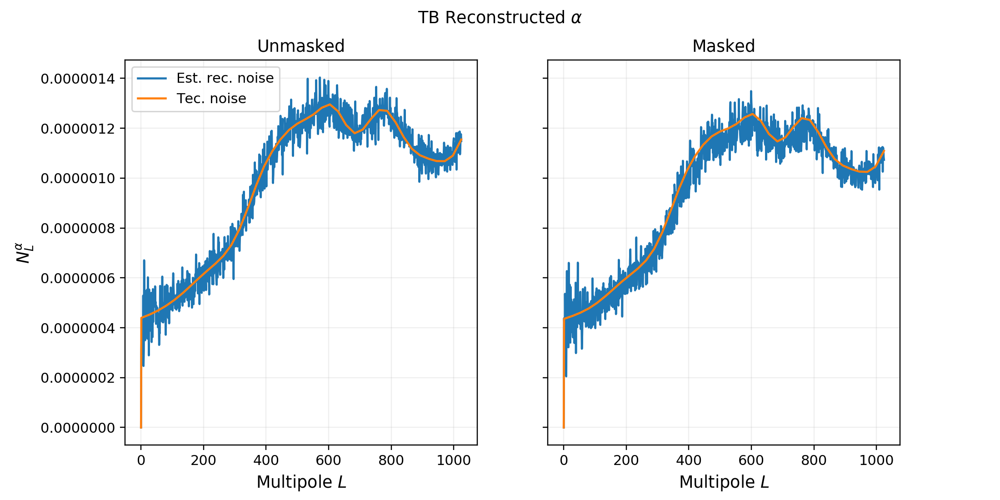

<IPython.core.display.Javascript object>


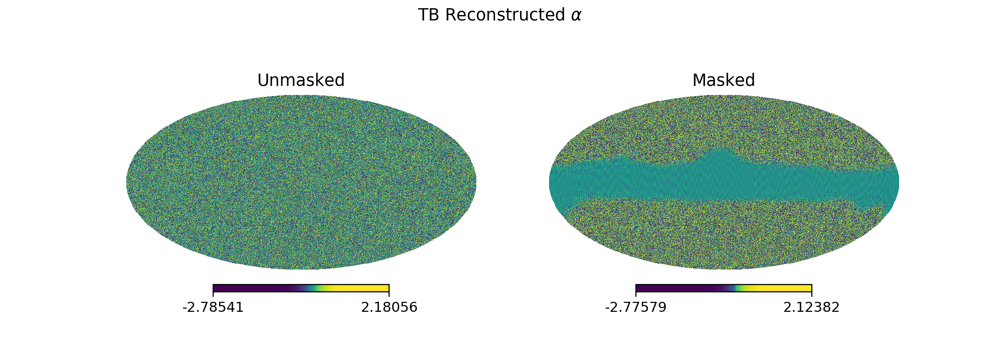

In [13]:
tb_pcmb=tb_rec.opt_tb_qe(cmb,clthr,lmax,Lmax,mask=mask,ellmin=lmin)
tb_pcmb.tb_reconstruct()

tb_cmb=tb_rec.opt_tb_qe(cmb,clthr,lmax,Lmax,ellmin=lmin)
tb_cmb.tb_reconstruct()

fig,ax=subplots(ncols=2,nrows=1,sharey=True,figsize=[10,5])
ax[0].plot(tb_cmb.Cl_rec_alpha,label="Est. rec. noise")
ax[0].plot(tb_cmb.N_L,label="Tec. noise")
ax[0].set_ylabel(r"$N_{L}^{\alpha}$",fontsize=12)
ax[0].set_xlabel(r"Multipole $L$",fontsize=12)
ax[0].grid(alpha=0.2)
ax[0].legend(loc=0)
ax[0].set_title("Unmasked")
ax[1].plot(tb_pcmb.Cl_rec_alpha)
ax[1].plot(tb_pcmb.N_L)
ax[1].set_xlabel(r"Multipole $L$",fontsize=12)
ax[1].grid(alpha=0.2)
ax[1].set_title("Masked")
suptitle(r"TB Reconstructed $\alpha$")
figname=figpath + "tb_null_masked_vs_unmasked_recnoise_lmin" + str(lmin) + "_lmax" + str(lmax) + "_Lmax" + str(Lmax) + ".pdf"
savefig(figname,bbox_inches="tight")

fig, (ax1, ax2) = plt.subplots(ncols=2,figsize=[10,3.5])
axes(ax1)
h.mollview( tb_cmb.rec_alpha ,hold=True,title="Unmasked",norm="hist")
axes(ax2)
h.mollview( tb_pcmb.rec_alpha ,hold=True,title="Masked",norm="hist")
suptitle(r"TB Reconstructed $\alpha$")
figname=figpath + "tb_null_masked_vs_unmasked_reconstructed_alpha_lmin" + str(lmin) + "_lmax" + str(lmax) + "_Lmax" + str(Lmax) + ".pdf"
savefig(figname,bbox_inches="tight",dpi=300)

## Injected signal analysis

<IPython.core.display.Javascript object>


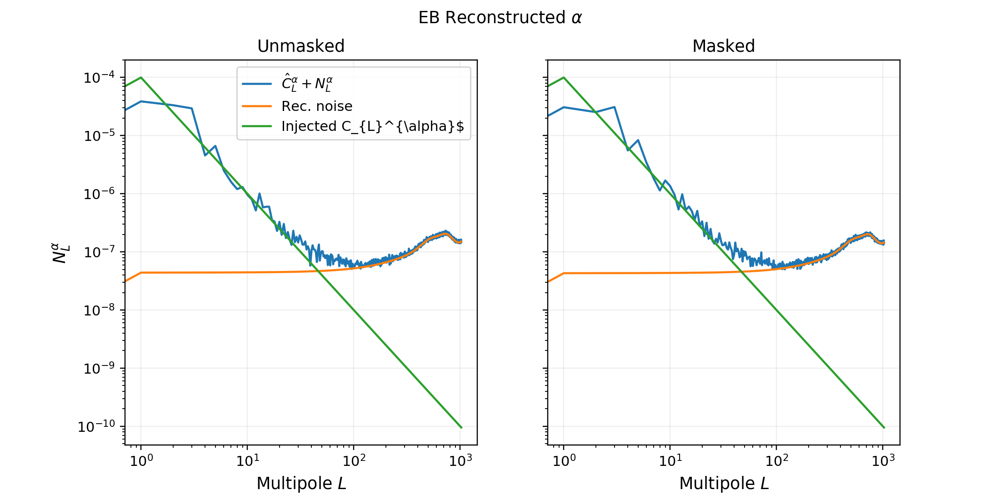

<IPython.core.display.Javascript object>


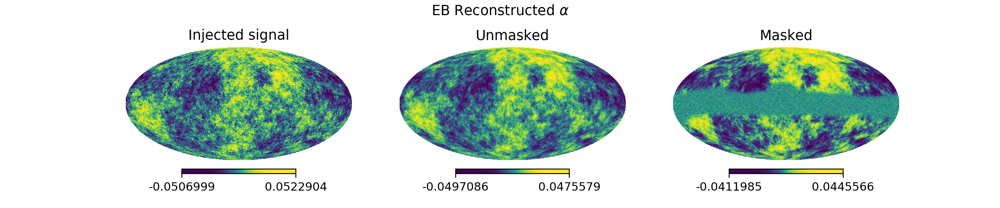

In [14]:
eb_pcmb=eb_rec.opt_eb_qe(obs,clthr,lmax,Lmax,mask=mask,ellmin=lmin)
eb_pcmb.eb_reconstruct()

eb_cmb=eb_rec.opt_eb_qe(obs,clthr,lmax,Lmax,ellmin=lmin)
eb_cmb.eb_reconstruct()

fig,ax=subplots(ncols=2,nrows=1,sharey=True,figsize=[10,5])
ax[0].plot(eb_cmb.Cl_rec_alpha,label=r"$\hat{C}_{L}^{\alpha} + N_{L}^{\alpha}$")
ax[0].plot(eb_cmb.N_L,label="Rec. noise")
ax[0].plot(cl_alpha,label=r"Injected C_{L}^{\alpha}$")
ax[0].set_ylabel(r"$N_{L}^{\alpha}$",fontsize=12)
ax[0].set_xlabel(r"Multipole $L$",fontsize=12)
ax[0].legend(loc=0)
ax[0].grid(alpha=0.2)
ax[0].set_title("Unmasked")
ax[0].loglog()
ax[1].plot(eb_pcmb.Cl_rec_alpha)
ax[1].plot(eb_pcmb.N_L)
ax[1].plot(cl_alpha)
ax[1].set_xlabel(r"Multipole $L$",fontsize=12)
ax[1].grid(alpha=0.2)
ax[1].loglog()
ax[1].set_title("Masked")
suptitle(r"EB Reconstructed $\alpha$")
figname=figpath + "eb_masked_vs_unmasked_recnoise_lmin" + str(lmin) + "_lmax" + str(lmax) + "_Lmax" + str(Lmax) + ".pdf"
savefig(figname,bbox_inches="tight")

fig, (ax1, ax2,ax3) = plt.subplots(ncols=3,figsize=[12,2.5])
axes(ax1)
h.mollview(alpha,hold=True,title="Injected signal",norm="hist")
axes(ax2)
h.mollview( eb_cmb.wf_rec_alpha ,hold=True,title="Unmasked",norm="hist")
axes(ax3)
h.mollview( eb_pcmb.wf_rec_alpha ,hold=True,title="Masked",norm="hist")
suptitle(r"EB Reconstructed $\alpha$")
figname=figpath + "eb_masked_vs_unmasked_reconstructed_alpha_lmin" + str(lmin) + "_lmax" + str(lmax) + "_Lmax" + str(Lmax) + ".pdf"
savefig(figname,bbox_inches="tight",dpi=300)

<IPython.core.display.Javascript object>


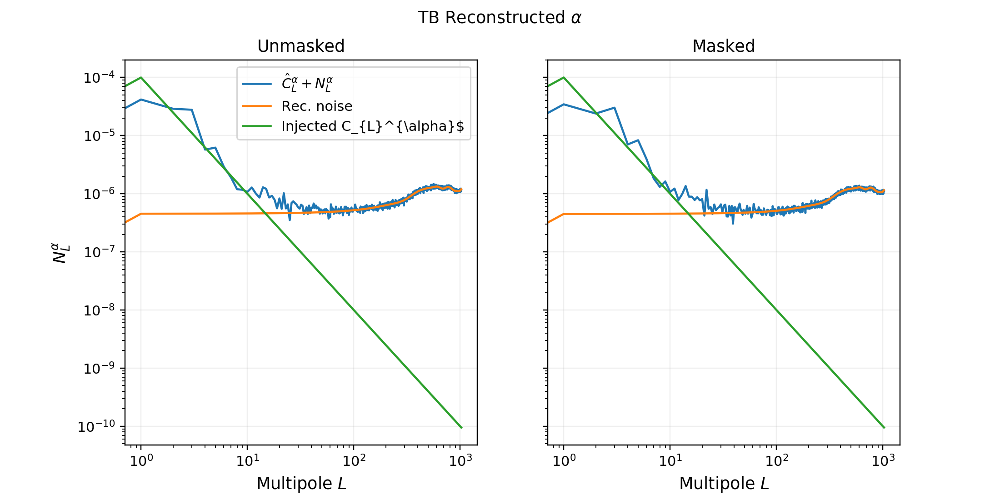

<IPython.core.display.Javascript object>


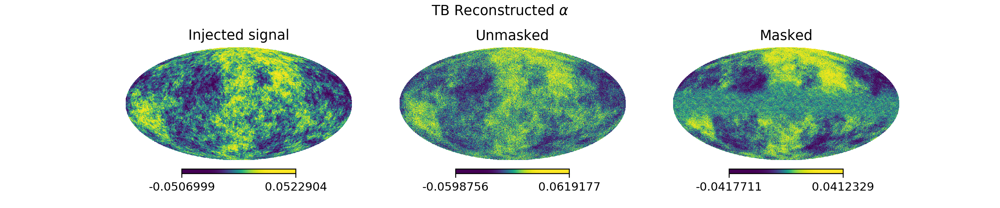

In [15]:
tb_pcmb=tb_rec.opt_tb_qe(obs,clthr,lmax,Lmax,mask=mask,ellmin=lmin)
tb_pcmb.tb_reconstruct()

tb_cmb=tb_rec.opt_tb_qe(obs,clthr,lmax,Lmax,ellmin=lmin)
tb_cmb.tb_reconstruct()

fig,ax=subplots(ncols=2,nrows=1,sharey=True,figsize=[10,5])
ax[0].plot(tb_cmb.Cl_rec_alpha,label=r"$\hat{C}_{L}^{\alpha} + N_{L}^{\alpha}$")
ax[0].plot(tb_cmb.N_L,label="Rec. noise")
ax[0].plot(cl_alpha,label=r"Injected C_{L}^{\alpha}$")
ax[0].set_ylabel(r"$N_{L}^{\alpha}$",fontsize=12)
ax[0].set_xlabel(r"Multipole $L$",fontsize=12)
ax[0].legend(loc=0)
ax[0].grid(alpha=0.2)
ax[0].set_title("Unmasked")
ax[0].loglog()
ax[1].plot(tb_pcmb.Cl_rec_alpha)
ax[1].plot(tb_pcmb.N_L)
ax[1].plot(cl_alpha)
ax[1].set_xlabel(r"Multipole $L$",fontsize=12)
ax[1].grid(alpha=0.2)
ax[1].loglog()
ax[1].set_title("Masked")
suptitle(r"TB Reconstructed $\alpha$")
figname=figpath + "tb_masked_vs_unmasked_recnoise_lmin" + str(lmin) + "_lmax" + str(lmax) + "_Lmax" + str(Lmax) + ".pdf"
savefig(figname,bbox_inches="tight")

fig, (ax1, ax2,ax3) = plt.subplots(ncols=3,figsize=[12,2.5])
axes(ax1)
h.mollview(alpha,hold=True,title="Injected signal",norm="hist")
axes(ax2)
h.mollview( tb_cmb.wf_rec_alpha ,hold=True,title="Unmasked",norm="hist")
axes(ax3)
h.mollview( tb_pcmb.wf_rec_alpha ,hold=True,title="Masked",norm="hist")
suptitle(r"TB Reconstructed $\alpha$")
figname=figpath + "tb_masked_vs_unmasked_reconstructed_alpha_lmin" + str(lmin) + "_lmax" + str(lmax) + "_Lmax" + str(Lmax) + ".pdf"
savefig(figname,bbox_inches="tight",dpi=300)